In [96]:
from tqdm import tqdm_notebook as tqdm
import numpy as np
import pandas as pd
from scipy import stats
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import matplotlib as mpl 
import seaborn as sns
%matplotlib inline
from ipywidgets import interact
from ipykernel.pylab.backend_inline import flush_figures
from collections import Counter
from datetime import datetime
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
import random

In [97]:
fname="data.csv"
kobe=pd.read_csv(fname)
kobe

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,Jump Shot,Jump Shot,10,20000012,33.9723,167,72,-118.1028,10,1,...,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,1
1,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,2
2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,1,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,3
3,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,1,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,4
4,Driving Dunk Shot,Dunk,155,20000012,34.0443,0,0,-118.2698,6,2,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,5
5,Jump Shot,Jump Shot,244,20000012,34.0553,-145,-11,-118.4148,9,3,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,6
6,Layup Shot,Layup,251,20000012,34.0443,0,0,-118.2698,8,3,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,7
7,Jump Shot,Jump Shot,254,20000012,34.0163,1,28,-118.2688,8,3,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,8
8,Jump Shot,Jump Shot,265,20000012,33.9363,-65,108,-118.3348,6,3,...,2PT Field Goal,Left Side(L),In The Paint (Non-RA),8-16 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,9
9,Running Jump Shot,Jump Shot,294,20000012,33.9193,-33,125,-118.3028,3,3,...,2PT Field Goal,Center(C),In The Paint (Non-RA),8-16 ft.,1610612747,Los Angeles Lakers,31/10/2000,LAL @ POR,POR,10


## מציאת עמודות ללא נתונים

In [98]:
kobe.isnull().sum() # בחינת עמודות שיש בהם NULL

action_type              0
combined_shot_type       0
game_event_id            0
game_id                  0
lat                      0
loc_x                    0
loc_y                    0
lon                      0
minutes_remaining        0
period                   0
playoffs                 0
season                   0
seconds_remaining        0
shot_distance            0
shot_made_flag        4998
shot_type                0
shot_zone_area           0
shot_zone_basic          0
shot_zone_range          0
team_id                  0
team_name                0
game_date                0
matchup                  0
opponent                 0
shot_id                  0
dtype: int64

In [99]:
kobe.shot_made_flag.unique() # מציאת ערכים NULL

array([nan,  0.,  1.])

In [100]:
kobe=kobe.dropna()  # הסרת ערכים NULL
kobe.shot_made_flag.unique()

array([0., 1.])

## מציאת חריגים לפי טווחי זריקה

In [101]:
kobe_pivot1=kobe.pivot_table(values="shot_id",columns ="shot_type", index="shot_zone_range",aggfunc="count", fill_value =0)
kobe_pivot1

shot_type,2PT Field Goal,3PT Field Goal
shot_zone_range,,
16-24 ft.,6847,61
24+ ft.,3,5278
8-16 ft.,5579,1
Back Court Shot,1,71
Less Than 8 ft.,7857,1


# מידות מגרש כדורסל

          
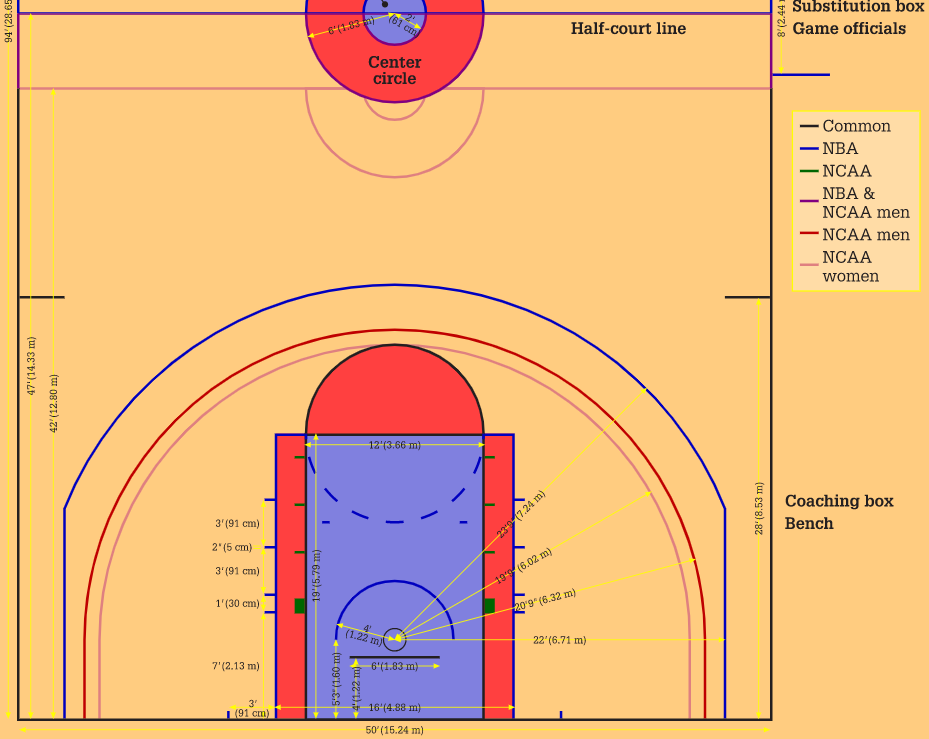

In [102]:
#תיקון סוגי זריקות
kobe.loc[kobe["shot_zone_range"]=="Back Court Shot" , "shot_type" ] ="3PT Field Goal"
kobe.loc[kobe["shot_zone_range"]=="Less Than 8 ft." , "shot_type" ] ="2PT Field Goal"
kobe.loc[kobe["shot_zone_range"]=="8-16 ft." , "shot_type" ] ="2PT Field Goal"
kobe.loc[kobe["shot_zone_range"]=="24+ ft." , "shot_type" ] ="3PT Field Goal"

In [103]:
#הצגה לאחר התיקון
kobe_pivot1=kobe.pivot_table(values="shot_id",columns ="shot_type", index="shot_zone_range",aggfunc="count", fill_value =0)
kobe_pivot1

shot_type,2PT Field Goal,3PT Field Goal
shot_zone_range,,
16-24 ft.,6847,61
24+ ft.,0,5281
8-16 ft.,5580,0
Back Court Shot,0,72
Less Than 8 ft.,7858,0


## מציאת חריגים לפי סוג זריקה

In [104]:
kobe_pivot2=kobe[kobe.combined_shot_type == "Dunk"].pivot_table(values="shot_id",columns ="shot_type", index="combined_shot_type",aggfunc="count", fill_value =0)
kobe_pivot2
#אין הטבעות שסווגו כזריקה ל3 נקודות

shot_type,2PT Field Goal
combined_shot_type,
Dunk,1056


## הוספת עמודה של שנת המשחק
#### המרת סוג העמודה "תאריך המשחק" לתאריך

In [105]:
kobe.game_date=pd.to_datetime(kobe.game_date)
kobe.dtypes

action_type                   object
combined_shot_type            object
game_event_id                  int64
game_id                        int64
lat                          float64
loc_x                          int64
loc_y                          int64
lon                          float64
minutes_remaining              int64
period                         int64
playoffs                       int64
season                        object
seconds_remaining              int64
shot_distance                  int64
shot_made_flag               float64
shot_type                     object
shot_zone_area                object
shot_zone_basic               object
shot_zone_range               object
team_id                        int64
team_name                     object
game_date             datetime64[ns]
matchup                       object
opponent                      object
shot_id                        int64
dtype: object

In [106]:
kobe["year_game_date"]=kobe.game_date.dt.year


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [107]:
kobe.nunique()

action_type              55
combined_shot_type        6
game_event_id           618
game_id                1558
lat                     446
loc_x                   486
loc_y                   446
lon                     486
minutes_remaining        12
period                    7
playoffs                  2
season                   20
seconds_remaining        60
shot_distance            74
shot_made_flag            2
shot_type                 2
shot_zone_area            6
shot_zone_basic           7
shot_zone_range           5
team_id                   1
team_name                 1
game_date              1558
matchup                  74
opponent                 33
shot_id               25699
year_game_date           21
dtype: int64

## ויזואליזציה

### כל הזריקות
### חלוקה לפי סלים ולפי זריקות שהתפספסו

In [108]:
#יצירת מילון צבעים 
districts = kobe.shot_made_flag.unique() 
colors = ['red', 'green', 'blue', 'orange', 'black', 'yellow', 'magenta', 'grey', 'white', 'cyan']
district_colors_zip = zip(districts, colors)  # list of tuples
district_colors = {k:v for k,v in district_colors_zip}
district_colors_points = kobe.shot_made_flag.map(district_colors)
district_colors

{0.0: 'red', 1.0: 'green'}

In [109]:

x = kobe.loc_x
y = kobe.loc_y
plt.figure(figsize=(10, 30), dpi=100)

plt.scatter(x,y ,zorder=1 ,edgecolor='k', c = district_colors_points,s=85) # סל ירוק החטאה אדום
   
img = plt.imread("p4.jpg")

plt.imshow(img, zorder=0, extent=[-255, 255, -15, 800])
ext=[-255, 255, -15, 800]
aspect=img.shape[0]/float(img.shape[1])*((ext[1]-ext[0])/(ext[3]-ext[2]))
plt.gca().set_aspect(aspect)




plt.show()

## חלוקת זריקות שנכנסו לסל לטווחי קליעה

In [110]:
kobe1=kobe
kobe1 = kobe1.drop(kobe1[kobe1.shot_made_flag == 0].index) # יצירת דאטה חדש המכיל קליעות לסל בלבד על ידי הסרת רשומות של זריקות שהתפספו

In [111]:
#יצירת מילון צבעים 
districts = kobe1.shot_zone_range.unique() 
colors = ['red', 'green', 'blue', 'orange', 'black', 'yellow', 'magenta', 'grey', 'white', 'cyan']
district_colors_zip = zip(districts, colors)  # list of tuples
district_colors = {k:v for k,v in district_colors_zip}
district_colors_points1 = kobe1.shot_zone_range.map(district_colors)
district_colors

{'16-24 ft.': 'red',
 'Less Than 8 ft.': 'green',
 '8-16 ft.': 'blue',
 '24+ ft.': 'orange',
 'Back Court Shot': 'black'}

In [112]:
x = kobe1.loc_x
y = kobe1.loc_y
plt.figure(figsize=(10, 30), dpi=100)

plt.scatter(x,y ,zorder=1 ,edgecolor='k', c = district_colors_points1 ,s=120) # חלוקה לפי  טווחי זריקה
img = plt.imread("p4.jpg")

plt.imshow(img, zorder=0, extent=[-255, 255, -15, 800])

aspect=img.shape[0]/float(img.shape[1])*((ext[1]-ext[0])/(ext[3]-ext[2]))
ext=[-255, 255, -15, 800]
plt.gca().set_aspect(aspect)



plt.show()

## ההסתברות לקלוע ממרחקים שונים נגד קבוצות יריבות

In [113]:
kobe_pivot_percent=\
kobe[kobe.shot_made_flag==1].pivot_table(values="shot_id",columns ="shot_zone_range", index="opponent",aggfunc="count", fill_value =0) \
/kobe.pivot_table(values="shot_id",columns ="shot_zone_range", index="opponent",aggfunc="count", fill_value =0)

In [114]:
kobe_pivot_percent

shot_zone_range,16-24 ft.,24+ ft.,8-16 ft.,Back Court Shot,Less Than 8 ft.
opponent,,,,,
ATL,0.385185,0.358696,0.376623,0.0,0.631579
BKN,0.352941,0.222222,0.500000,NaN,0.533333
BOS,0.354067,0.324022,0.439560,0.0,0.521327
CHA,0.430464,0.292035,0.428571,NaN,0.565217
CHI,0.371951,0.265306,0.461538,0.0,0.595588
CLE,0.397260,0.357895,0.456140,0.0,0.518987
DAL,0.417857,0.313514,0.475410,0.0,0.559748
DEN,0.456693,0.311475,0.504065,0.0,0.540670
DET,0.387283,0.299145,0.413223,0.0,0.611429


AxesSubplot(0.125,0.125;0.62x0.755)


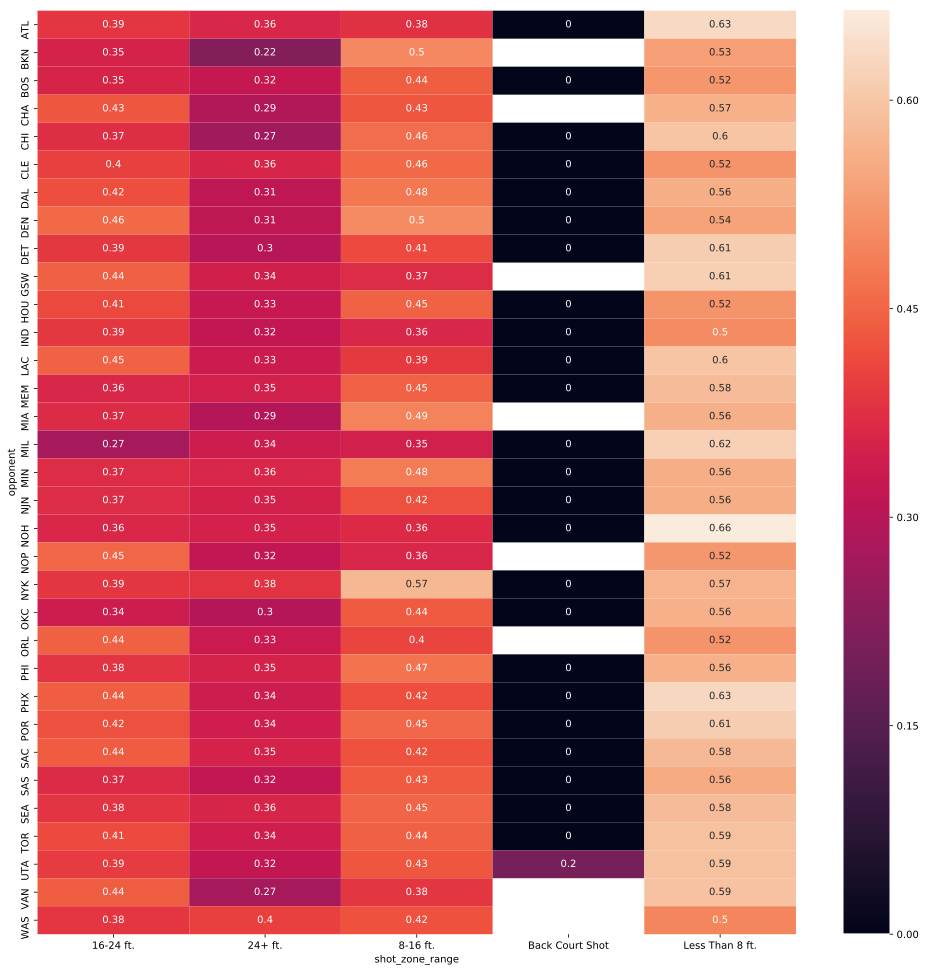

In [115]:
plt.subplots(figsize=(17,17))
print(sns.heatmap(kobe_pivot_percent, annot=True))

## חלוקת זריקות שנכנסו לסל לפי אזורי קליעה

In [116]:
kobe2=kobe
kobe2 = kobe2.drop(kobe2[kobe2.shot_made_flag == 0].index) # 

In [117]:
#יצירת מילון צבעים 
districts = kobe2.shot_zone_area.unique() 
colors = ['red', 'green', 'blue', 'orange', 'white', 'yellow']
district_colors_zip = zip(districts, colors)  # list of tuples
district_colors = {k:v for k,v in district_colors_zip}
district_colors_points2 = kobe2.shot_zone_area.map(district_colors)
district_colors


{'Left Side Center(LC)': 'red',
 'Center(C)': 'green',
 'Left Side(L)': 'blue',
 'Right Side Center(RC)': 'orange',
 'Right Side(R)': 'white',
 'Back Court(BC)': 'yellow'}

In [149]:
shot_exemple=kobe.loc[kobe.shot_id==28682]
shot_exemple

#https://www.youtube.com/watch?v=-36cCuR4Tek
# 8:06    

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id,year_game_date
28681,Pullup Jump shot,Jump Shot,355,40800223,33.7153,0,329,-118.2698,0,3,...,Center(C),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2009-08-05,LAL @ HOU,HOU,28682,2009


In [153]:
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
set_matplotlib_formats("svg")
plt.figure(figsize=(12, 30), dpi=100)

x = kobe1.loc_x
y = kobe1.loc_y

# fig, ax = plt.subplots()
plt.scatter(x, y)
plt.scatter(x,y ,zorder=1 ,edgecolor='k', c = district_colors_points2 ,s=120) # חלוקה לפי  טווחי זריקה

text = plt.annotate("shot_exemple", xy=(0,329), xytext=(10,329),
                    url='http://matplotlib.org', 
                    bbox=dict(color='w', alpha=1e-6, url='https://www.youtube.com/watch?v=-36cCuR4Tek'))

plt.imshow(img, zorder=0, extent=[-255, 255, -25, 800])
ext=[-255, 255, -25, 800]
aspect=img.shape[0]/float(img.shape[1])*((ext[1]-ext[0])/(ext[3]-ext[2]))
plt.gca().set_aspect(aspect)

img = plt.imread("p4.jpg")
plt.show()

## גרף המציג את שיעורי הקליעה ל-3 לאורך שנים

In [158]:
kobe3=kobe
kobe3 = kobe3.drop(kobe3[kobe3.shot_type == "2PT Field Goal"].index) # יצירת דאטה רק זריקות ל3
kobe_pivot6=kobe3.pivot_table(values="shot_id",columns ="shot_made_flag", index="year_game_date",aggfunc="count", fill_value =0)
kobe_pivot6["mean"]=kobe_pivot6.apply(lambda row:row[1]/(row[0]+row[1]),axis=1) #  הוספת עמודה ממוצע קליעות
kobe_pivot6

shot_made_flag,0.0,1.0,mean
year_game_date,,,
1996,16,13,0.448276
1997,114,57,0.333333
1998,75,44,0.369748
1999,93,34,0.267717
2000,170,89,0.343629
2001,105,43,0.290541
2002,127,55,0.302198
2003,187,120,0.390879
2004,234,108,0.315789


In [159]:
kobe4=kobe
kobe4 = kobe4.drop(kobe4[kobe4.shot_type == "3PT Field Goal"].index) # יצירת דאטה רק זריקות ל3
kobe_pivot5=kobe4.pivot_table(values="shot_id",columns ="shot_made_flag", index="year_game_date",aggfunc="count", fill_value =0)
kobe_pivot5["mean"]=kobe_pivot5.apply(lambda row:row[1]/(row[0]+row[1]),axis=1) #  הוספת עמודה ממוצע קליעות
kobe_pivot5

shot_made_flag,0.0,1.0,mean
year_game_date,,,
1996,27,13,0.325000
1997,242,212,0.466960
1998,208,172,0.452632
1999,437,419,0.489486
2000,737,720,0.494166
2001,646,603,0.482786
2002,911,767,0.457092
2003,726,575,0.441968
2004,626,538,0.462199


In [160]:
kobe_pivot5['mean'].values

array([0.325     , 0.46696035, 0.45263158, 0.48948598, 0.49416609,
       0.48278623, 0.45709178, 0.44196772, 0.46219931, 0.48197734,
       0.5078125 , 0.47815727, 0.51023289, 0.49937186, 0.46927803,
       0.49524941, 0.47095871, 0.50689127, 0.41581633, 0.40636042,
       0.40909091])

In [161]:
kobe_pivot6['mean'].values

array([0.44827586, 0.33333333, 0.3697479 , 0.26771654, 0.34362934,
       0.29054054, 0.3021978 , 0.39087948, 0.31578947, 0.33783784,
       0.36231884, 0.35501355, 0.35340314, 0.34031414, 0.34183673,
       0.27510917, 0.32494279, 0.25510204, 0.27272727, 0.27142857,
       0.3018018 ])

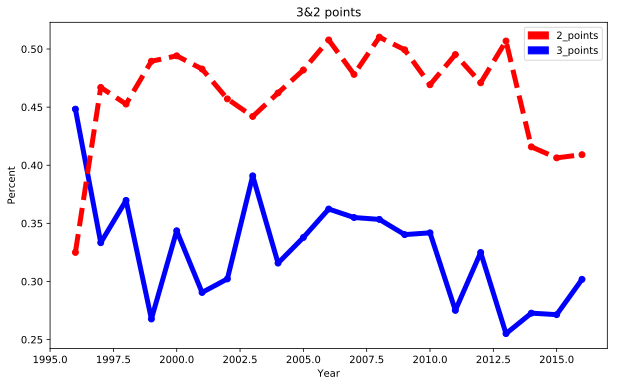

In [168]:
import matplotlib.patches as mpatches
fig=plt.figure(figsize=(10,6))

ax=fig.gca()
ax.set_title('3&2 points')
ax.set_ylabel('Percent')
ax.set_xlabel('Year')
line1=ax.plot(kobe_pivot6.index.values,kobe_pivot6['mean'].values,"b-o",linewidth=5)
line2=ax.plot(kobe_pivot5.index.values,kobe_pivot5['mean'].values,"r--o",linewidth=5)
 
red_patch = mpatches.Patch(color='red', label='2_points')
blue_patch = mpatches.Patch(color='blue', label='3_points')
plt.legend(handles=[red_patch,blue_patch])

plt.show()

# סטטיסטיקה
## קוריאלציה

In [124]:
kobe.corr()["shot_made_flag"]

game_event_id       -0.037203
game_id             -0.001543
lat                  0.148155
loc_x               -0.000917
loc_y               -0.148155
lon                 -0.000917
minutes_remaining    0.028267
period              -0.032150
playoffs            -0.001170
seconds_remaining    0.030690
shot_distance       -0.198262
shot_made_flag       1.000000
team_id                   NaN
shot_id             -0.012948
year_game_date      -0.018580
Name: shot_made_flag, dtype: float64

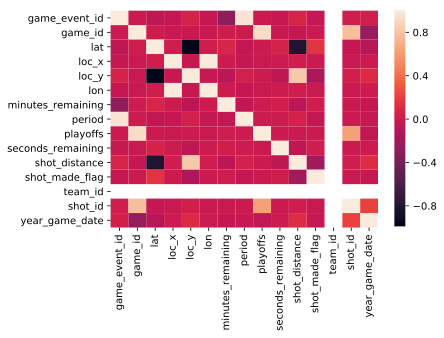

In [125]:
hm = sns.heatmap(kobe.corr())

## השערת האפס 

In [126]:
kobe3=kobe
kobe4=kobe
kobe3 = kobe3.drop(kobe3[kobe3.shot_type == "2PT Field Goal"].index) # יצירת דאטה רק זריקות ל3
kobe4 = kobe4.drop(kobe4[kobe4.shot_type == "3PT Field Goal"].index) # יצירת דאטה רק זריקות ל2


In [127]:
kobe_pivot3=kobe3.pivot_table(values="shot_id",columns ="shot_made_flag", index="shot_type",aggfunc="count", fill_value =0)
kobe_pivot3["prior_ctr"]=kobe_pivot3.apply(lambda row:row[1]/(row[0]+row[1]),axis=1) #ממוצע סלים  ל3
kobe_pivot3 # השערת האפס היא שממוצע הזריקות ל-3 הוא 32.9 אחוז

shot_made_flag,0.0,1.0,prior_ctr
shot_type,,,
3PT Field Goal,3631,1783,0.329331


In [128]:
prior_ctr_3point=kobe_pivot3["prior_ctr"][0]
print(prior_ctr_3point)

0.3293313631326191


In [129]:
kobe_pivot4=kobe4.pivot_table(values="shot_id",columns ="shot_made_flag", index="shot_type",aggfunc="count", fill_value =0)
kobe_pivot4["prior_ctr"]=kobe_pivot4.apply(lambda row:row[1]/(row[0]+row[1]),axis=1) #הוספת עמודה ממוצע סלים ל-2 
kobe_pivot4 # השערת האפס היא שממוצע הזריקות ל-2 הוא 47.7 אחוז

shot_made_flag,0.0,1.0,prior_ctr
shot_type,,,
2PT Field Goal,10601,9684,0.477397


In [130]:
prior_ctr_2point=kobe_pivot4["prior_ctr"][0]
print(prior_ctr_2point)

0.4773970914468819


## בחינת דחיית השערת האפס ברמת קבוצה יריבה זריקות ל-3

In [131]:
kobe_pivot5=kobe3.pivot_table(values="shot_id",columns ="shot_made_flag", index="opponent",aggfunc="count", fill_value =0)
kobe_pivot5["shot_diff"]=kobe_pivot5.apply(lambda row:row[1]/(row[0]+row[1])- prior_ctr_3point, axis=1)
kobe_pivot5["p_value"]=kobe_pivot5.apply(lambda row:
                                        stats.binom_test(row[1],row[0]+row[1],p=prior_ctr_3point, alternative="two-sided"),axis=1)
kobe_pivot5

shot_made_flag,0.0,1.0,shot_diff,p_value
opponent,,,,
ATL,60,33,0.025507,0.583322
BKN,7,2,-0.107109,0.726960
BOS,124,58,-0.010650,0.813135
CHA,81,34,-0.033679,0.488008
CHI,73,28,-0.052104,0.290772
CLE,63,34,0.021184,0.666341
DAL,137,58,-0.031895,0.361408
DEN,213,95,-0.020890,0.467076
DET,84,36,-0.029331,0.560243


In [132]:
#alpha=0.005
alpha=0.05

print(""" Significantly Differnt: {yes}
No significantly: {no}"""
      .format(
yes=kobe_pivot5[kobe_pivot5.p_value<=alpha].index.values,
no=kobe_pivot5[kobe_pivot5.p_value>alpha].index.values
))

 Significantly Differnt: []
No significantly: ['ATL' 'BKN' 'BOS' 'CHA' 'CHI' 'CLE' 'DAL' 'DEN' 'DET' 'GSW' 'HOU' 'IND'
 'LAC' 'MEM' 'MIA' 'MIL' 'MIN' 'NJN' 'NOH' 'NOP' 'NYK' 'OKC' 'ORL' 'PHI'
 'PHX' 'POR' 'SAC' 'SAS' 'SEA' 'TOR' 'UTA' 'VAN' 'WAS']


## בחינת דחיית השערת האפס ברמת קבוצה יריבה זריקות ל-2 

In [133]:
kobe_pivot6=kobe4.pivot_table(values="shot_id",columns ="shot_made_flag", index="opponent",aggfunc="count", fill_value =0)
kobe_pivot6["shot_diff"]=kobe_pivot6.apply(lambda row:row[1]/(row[0]+row[1])- prior_ctr_2point, axis=1)
kobe_pivot6["p_value"]=kobe_pivot6.apply(lambda row:
                                        stats.binom_test(row[1],row[0]+row[1],p=prior_ctr_2point, alternative="two-sided"),axis=1)
kobe_pivot6

shot_made_flag,0.0,1.0,shot_diff,p_value
opponent,,,,
ATL,180,165,0.000864,1.000000
BKN,20,16,-0.032953,0.740708
BOS,337,264,-0.038129,0.066057
CHA,201,184,0.000525,1.000000
CHI,221,194,-0.009927,0.694516
CLE,225,192,-0.016965,0.492989
DAL,427,411,0.013056,0.467754
DEN,520,524,0.024519,0.114168
DET,244,223,0.000119,1.000000


In [134]:
#alpha=0.005
alpha=0.05
print(""" Significantly Differnt: {yes}
No significantly: {no}"""
      .format(
yes=kobe_pivot6[kobe_pivot6.p_value<=alpha].index.values,
no=kobe_pivot6[kobe_pivot6.p_value>alpha].index.values
))

 Significantly Differnt: ['IND']
No significantly: ['ATL' 'BKN' 'BOS' 'CHA' 'CHI' 'CLE' 'DAL' 'DEN' 'DET' 'GSW' 'HOU' 'LAC'
 'MEM' 'MIA' 'MIL' 'MIN' 'NJN' 'NOH' 'NOP' 'NYK' 'OKC' 'ORL' 'PHI' 'PHX'
 'POR' 'SAC' 'SAS' 'SEA' 'TOR' 'UTA' 'VAN' 'WAS']


## אנטרופיה

In [135]:
def mutual_info(p):
    p_x=p.sum(axis=1)
    p_y=p.sum(axis=0)
    I=0.0
    for i_y in p.index:
        for i_x in p.columns:
            if p.loc[i_y,i_x]>0:
                I+=(p.loc[i_y,i_x]*np.log2(p.loc[i_y,i_x]/(p_x[i_y]*p_y[i_x])))
    return I

In [136]:
name_columns=['action_type', 'combined_shot_type','shot_type','shot_zone_area', 'shot_zone_basic','team_name','matchup',
              'opponent', 'shot_zone_range',]
name_columns

['action_type',
 'combined_shot_type',
 'shot_type',
 'shot_zone_area',
 'shot_zone_basic',
 'team_name',
 'matchup',
 'opponent',
 'shot_zone_range']

In [137]:
list_Entropy=[]
for i in name_columns:
    col_distribution=kobe.pivot_table(values="shot_id",columns ="shot_made_flag", index=i ,aggfunc="count")
    col_distribution/=col_distribution.sum().sum()
    print(i,"=",mutual_info(col_distribution))


action_type = 0.10956182260060537
combined_shot_type = 0.047650229918138214
shot_type = 0.010864132478797021
shot_zone_area = 0.016539338465243962
shot_zone_basic = 0.03160561452761516
team_name = 0.0
matchup = 0.0021415541218235733
opponent = 0.0009157924257810628
shot_zone_range = 0.025974204849865776
